## Objective

To predict the concrete strength using the data available in file concrete_data.xls. Apply feature engineering and model tuning to obtain 80% to 95% of R2score.

## Input variables:
## contents of concrete mixture:
* Cement (cement) -- quantitative -- kg in a m3 mixture -- Input Variable
* Blast Furnace Slag (slag) -- quantitative -- kg in a m3 mixture -- Input Variable
* Fly Ash (ash) -- quantitative -- kg in a m3 mixture -- Input Variable
* Water (water) -- quantitative -- kg in a m3 mixture -- Input Variable
* Superplasticizer (superplastic) -- quantitative -- kg in a m3 mixture -- Input Variable
* Coarse Aggregate (coarseagg) -- quantitative -- kg in a m3 mixture -- Input Variable
* Fine Aggregate (fineagg) -- quantitative -- kg in a m3 mixture -- Input Variable
* Age(age) -- quantitative -- Day (1~365) -- Input Variable
* Concrete compressive strength(strength) -- quantitative -- MPa -- Output Variable

## Closer look at Analytics Base Table
* It needs to be found if 0 values are missing or plausible values
* Fly Ash and Superplasticizer values seems suspicious as they contain 0 values which results in days required to be are in the range of 120 - 365 days


In [465]:
import warnings
warnings.filterwarnings('ignore')

In [466]:
## importing libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn import metrics
%matplotlib inline
#from sklearn.linear_model import Ridge
#from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

# Exploratory data quality report

In [467]:
# importing data
df = pd.read_csv("concrete.csv")
df.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29


In [468]:
df.shape

(1030, 9)

## 1. Univariate Analysis

### data types and description

In [469]:
df.dtypes

cement          float64
slag            float64
ash             float64
water           float64
superplastic    float64
coarseagg       float64
fineagg         float64
age               int64
strength        float64
dtype: object

In [470]:
# Statistical summary 
df.describe(percentiles=[.25,.5,.75,.90,.95,.99]).transpose()

,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
cement,1030.0,281.167864,104.506364,102.00,192.375,272.900,350.000,425.00,480.000,531.300,540.0
slag,1030.0,73.895825,86.279342,0.00,0.000,22.000,142.950,192.00,236.000,290.200,359.4
ash,1030.0,54.188350,63.997004,0.00,0.000,0.000,118.300,141.06,167.000,185.213,200.1
water,1030.0,181.567282,21.354219,121.80,164.900,185.000,192.000,203.50,228.000,228.000,247.0
superplastic,1030.0,6.204660,5.973841,0.00,0.000,6.400,10.200,12.21,16.055,23.400,32.2
coarseagg,1030.0,972.918932,77.753954,801.00,932.000,968.000,1029.400,1076.45,1104.000,1125.000,1145.0
fineagg,1030.0,773.580485,80.175980,594.00,730.950,779.500,824.000,880.76,898.090,943.100,992.6
age,1030.0,45.662136,63.169912,1.00,7.000,28.000,56.000,100.00,180.000,365.000,365.0
strength,1030.0,35.817961,16.705742,2.33,23.710,34.445,46.135,58.82,66.802,77.300,82.6


In [471]:
df.median()

cement          272.900
slag             22.000
ash               0.000
water           185.000
superplastic      6.400
coarseagg       968.000
fineagg         779.500
age              28.000
strength         34.445
dtype: float64

### Analysis of the body of distributions / tails, missing values, outliers

In [472]:
# check for null values
df.isna().sum()

cement          0
slag            0
ash             0
water           0
superplastic    0
coarseagg       0
fineagg         0
age             0
strength        0
dtype: int64

In [473]:
# you can also find it using the snippet below
df.isnull().apply(pd.value_counts)  

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
False,1030,1030,1030,1030,1030,1030,1030,1030,1030


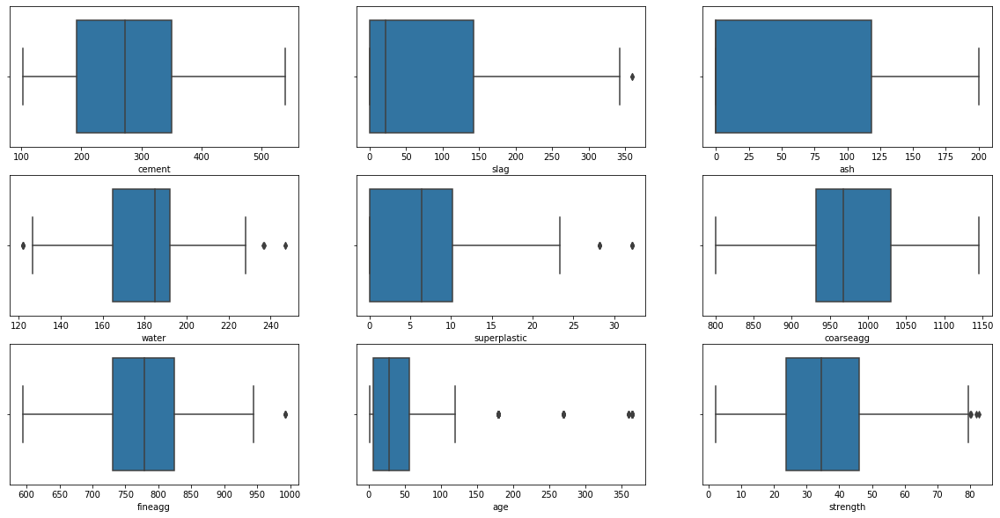

In [474]:
# using subplot(), use a for loop
plt.figure(figsize= (20,10))  # setting the figure size
pos = 1  # we will use this variable to index each of the plots
for i in df.columns:
    plt.subplot(3, 3, pos)
    sns.boxplot( df[i]);
    pos += 1  # to plot over the grid one by one   

### Removing Outliers

In [475]:
# Removing outliers using IQR method
df["slag"] = np.where(df["slag"] <df['slag'].quantile(0.10), df['slag'].quantile(0.10),df['slag'])
df["slag"] = np.where(df["slag"] >df['slag'].quantile(0.90), df['slag'].quantile(0.90),df['slag'])

In [476]:
# Removing outliers using IQR method
df["water"] = np.where(df["water"] <df['water'].quantile(0.10), df['water'].quantile(0.10),df['water'])
df["water"] = np.where(df["water"] >df['water'].quantile(0.90), df['water'].quantile(0.90),df['water'])

In [477]:
# Removing outliers using IQR method
df["superplastic"] = np.where(df["superplastic"] <df['superplastic'].quantile(0.10), df['superplastic'].quantile(0.10),df['superplastic'])
df["superplastic"] = np.where(df["superplastic"] >df['superplastic'].quantile(0.90), df['superplastic'].quantile(0.90),df['superplastic'])

In [478]:
# Removing outliers using IQR method
df["fineagg"] = np.where(df["fineagg"] <df['fineagg'].quantile(0.10), df['fineagg'].quantile(0.10),df['fineagg'])
df["fineagg"] = np.where(df["fineagg"] >df['fineagg'].quantile(0.90), df['fineagg'].quantile(0.90),df['fineagg'])

In [479]:
# Removing outliers using IQR method
df["age"] = np.where(df["age"] <df['age'].quantile(0.10), df['age'].quantile(0.10),df['age'])
df["age"] = np.where(df["age"] >df['age'].quantile(0.90), df['age'].quantile(0.90),df['age'])

In [480]:
# Removing outliers using IQR method
df["strength"] = np.where(df["strength"] <df['strength'].quantile(0.10), df['strength'].quantile(0.10),df['strength'])
df["strength"] = np.where(df["strength"] >df['strength'].quantile(0.90), df['strength'].quantile(0.90),df['strength'])

### Removing outliers effects the training accuracy, it is creating an overfit model. Therefore it is assumed that outliers seen in boxplots are not outliers of the model.

## 2. Bivariate Analysis

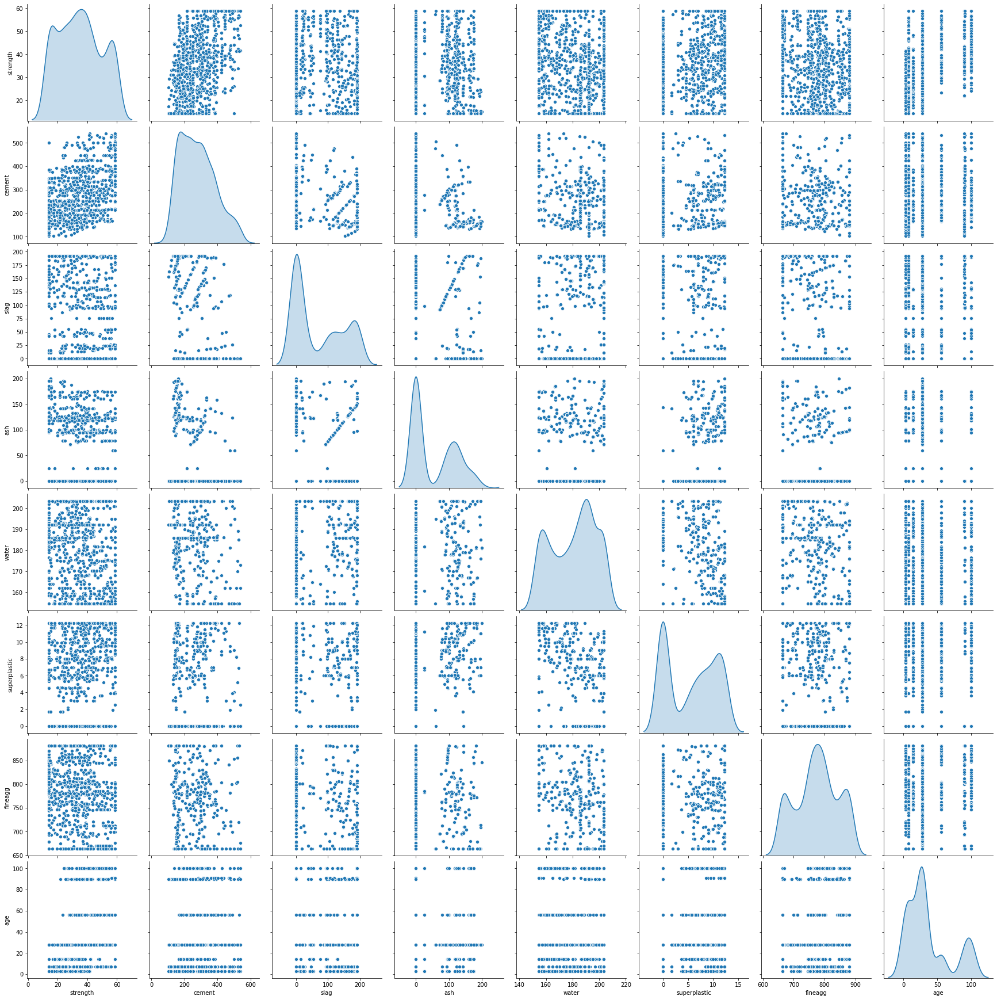

In [481]:
sns.pairplot(df[['strength','cement', 'slag', 'ash', 'water', 'superplastic','fineagg', 'age']], diag_kind='kde', height=3, aspect=1)

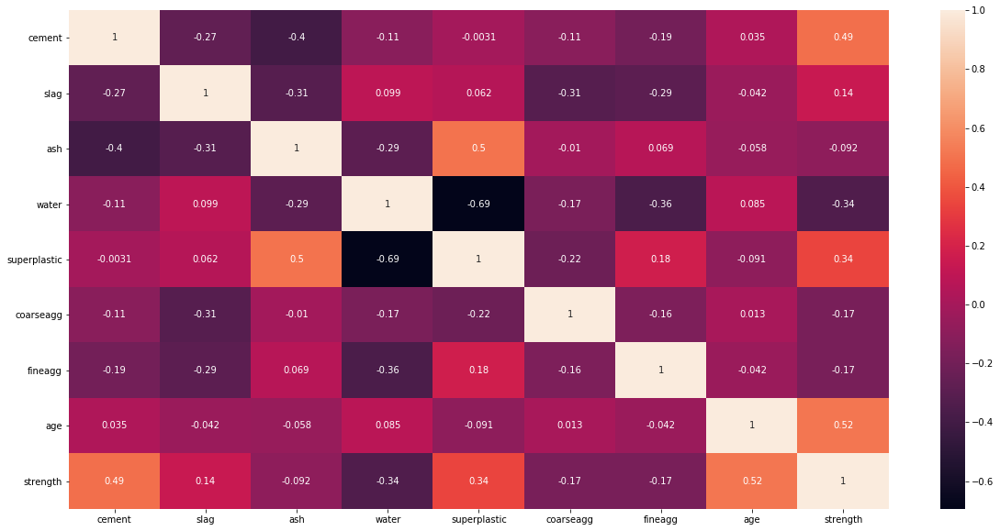

In [482]:
# Let's see the correlation matrix
plt.figure(figsize = (20, 10))
sns.heatmap(df.corr(), annot=True);

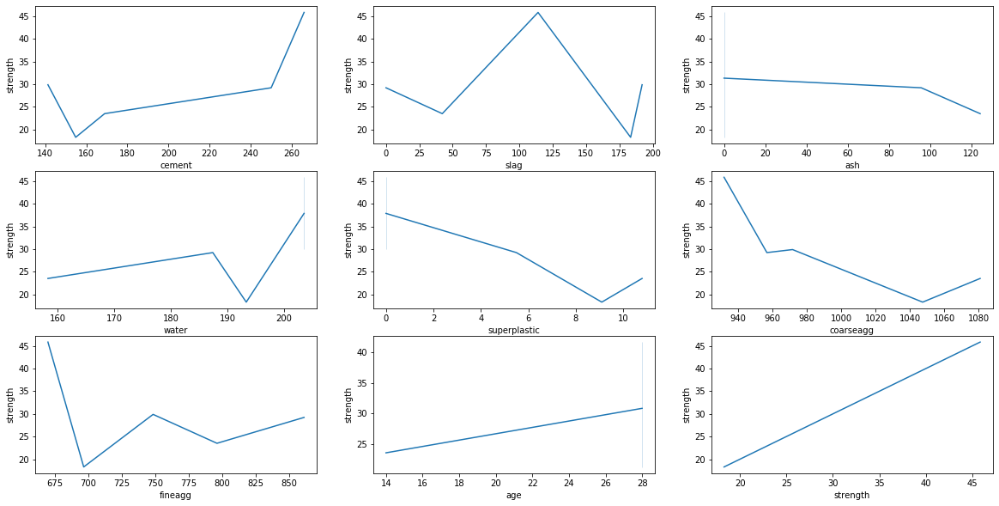

In [483]:
# subplot() with for loop
plt.figure(figsize= (20,10))  # Figure size
pos = 1 # Index
for i in df.columns:
    plt.subplot(3, 3, pos)
    sns.lineplot(x=i,y='strength', data=df.head() )
    pos += 1  # grid plot   

* There sharp slopes in the above graphs
* It can be seen from the above graphs that concrete strength has a positive correlation with cement(0.5), superplastic (0.37) and age (0.33) and negative correlation with water (-0.29)
* Also correlations can be observed between independent variables such as fineaggr and water (0.45), superplastic and water (-0.66), ash and cement(-0.45) 
* It is to be seen how this correlation between independent variables effects the results and then accordingly some of these variables are dropped

## 3. Feature Engineering Techniques

* To improve the performance of the model, the polynomial features are generated. But due to which the number of features increase leading to curse of dimensionality. There lasso/Ridge regression can be used to reduce this effect. I have not found much of an advantage employing lasso and ridge regression with polynomial features so, I removed them.

## Data Preperation (Data scaling, Data splitting)

In [484]:
## Define X and Y variables
X_orig = df.drop('strength', axis=1)
y_orig = df[['strength']]

In [485]:
# Here all dependent variable are scaled, independent variable is not necessary to be scaled
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
cols_to_scale = ['cement', 'slag', 'ash', 'water', 'superplastic', 'coarseagg', 'fineagg', 'age', 'strength']
df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale].to_numpy())
df.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,-1.339017,1.598334,-0.847144,1.384956,-1.171819,-0.014398,-0.405328,-0.262215,-0.375312
1,-1.074790,-0.350519,1.096078,-1.368456,1.060932,1.388141,0.307798,-0.703113,-0.820205
2,-0.298384,-0.899529,0.648965,0.404206,-0.034770,-0.206121,1.279562,-0.262215,-0.422033
3,-0.145209,0.583577,-0.847144,1.384956,-1.171819,-0.526517,-1.578920,-0.262215,0.737617
4,-1.209776,1.486451,-0.847144,0.763611,0.709481,0.958372,-1.179749,-0.262215,-1.184208


In [486]:
## Define X and Y variables
X = df.drop('strength', axis=1)
y = df[['strength']]

In [487]:
# Splitting the data into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [488]:
import statsmodels.api as sm          # Importing statsmodels
# create a first fitted model
lm_1 = sm.OLS(y_train,X_train).fit()

In [489]:
#Let's see the summary of our first linear model
print(lm_1.summary())

OLS Regression Results                                
Dep. Variable:               strength   R-squared (uncentered):                   0.745
Model:                            OLS   Adj. R-squared (uncentered):              0.743
Method:                 Least Squares   F-statistic:                              261.0
Date:                Fri, 28 Aug 2020   Prob (F-statistic):                   4.68e-206
Time:                        01:02:38   Log-Likelihood:                         -528.26
No. Observations:                 721   AIC:                                      1073.
Df Residuals:                     713   BIC:                                      1109.
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------

In [490]:
X_train = X_train.drop('coarseagg', axis=1)
X_train = X_train.drop('fineagg', axis=1)
X_test = X_test.drop('coarseagg', axis=1)
X_test = X_test.drop('fineagg', axis=1)

In [491]:
lm_2 = sm.OLS(y_train,X_train).fit()

In [492]:
print(lm_2.summary())  #Inferential statistics

OLS Regression Results                                
Dep. Variable:               strength   R-squared (uncentered):                   0.745
Model:                            OLS   Adj. R-squared (uncentered):              0.743
Method:                 Least Squares   F-statistic:                              347.9
Date:                Fri, 28 Aug 2020   Prob (F-statistic):                   3.04e-208
Time:                        01:02:38   Log-Likelihood:                         -529.09
No. Observations:                 721   AIC:                                      1070.
Df Residuals:                     715   BIC:                                      1098.
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------

In [493]:
## Define X and Y variables
X = df.drop(['strength', 'coarseagg', 'fineagg'], axis=1)
y = df[['strength']]

In [494]:
## Define X and Y variables
X_orig = X_orig.drop(['coarseagg', 'fineagg'], axis=1)

In [495]:
# Splitting the data into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

## Feature extraction


### Linear Regression without feature extraction

In [496]:
#Linear Regression with only feedback columns
from sklearn.linear_model import LinearRegression #importing linear regression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
lr = LinearRegression()
lr.fit(X_train, y_train)
pred = lr.predict(X_test)  # Predictions from linear regression
tr_lin = lr.score(X_train, y_train)
print("Training Accuracy of Simple Linear Regression is", tr_lin)
r2_lin = r2_score(y_test, pred)
print("R2 Score for Simple Linear Regression is", r2_lin)

Training Accuracy of Simple Linear Regression is 0.7447543440536413
R2 Score for Simple Linear Regression is 0.7514744296209825


In [497]:
data_train = pd.concat([X_train, y_train], axis=1)
data_train.head()

,cement,slag,ash,water,superplastic,age,strength
282,0.965311,-0.899529,-0.847144,0.318923,-1.171819,-0.262215,0.149773
599,-1.303595,-0.899529,1.247721,0.014342,1.102279,-0.262215,-1.469413
252,-1.227008,1.598334,-0.847144,1.171750,0.068598,-0.262215,-0.586601
193,-1.169567,1.598334,1.669821,1.232666,0.275335,-0.262215,-0.306277
644,-1.027880,0.315578,1.652624,-0.515629,0.833522,-0.703113,-0.399021


In [498]:
mse = np.mean((lr.predict(X_test)-y_test)**2)

In [499]:
import math
math.sqrt(mse)

0.5004486025334116

Text(0.5, 1.0, 'Linear Regression')

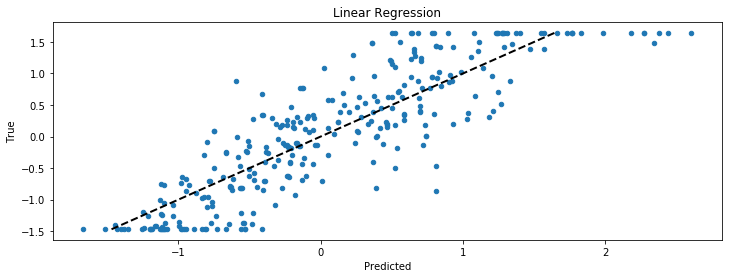

In [500]:
fig, ax1 = plt.subplots(1,1, figsize=(12,4)) 
ax1.scatter(pred, y_test, s=20) 
ax1.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2) 
ax1.set_ylabel("True") 
ax1.set_xlabel("Predicted") 
ax1.set_title("Linear Regression") 


### Linear regression with polynomial features

In [501]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(degree = 2, interaction_only=True)
X_poly = poly.fit_transform(X)
X_train_poly, X_test_poly, y_train_poly, y_test_poly = train_test_split(X_poly, y, train_size = 0.70, test_size=0.30, random_state=1)
X_train.shape

(721, 6)

In [502]:
lr.fit(X_train_poly,y_train_poly)
ypoly_pred = lr.predict(X_test_poly)
poly_score = lr.score(X_train_poly, y_train_poly)
print("Training Accuracy with polynomial features is", poly_score)
acc = r2_score(y_test_poly,ypoly_pred)
print("R2 score by adding polynomial features is: ", acc)

Training Accuracy with polynomial features is 0.781522403689314
R2 score by adding polynomial features is:  0.7579270030747157


In [503]:
print(lr.coef_[0])

[ 0.          0.63987901  0.3975011   0.16908971 -0.21628848  0.173894
  0.59723868 -0.00268184  0.11534421 -0.04690585 -0.12647931 -0.0080808
  0.07937994  0.00344538 -0.07240459  0.06011697 -0.08371336 -0.17935893
  0.09348512  0.10960763  0.00493125  0.01520988]


Text(0.5, 1.0, 'Linear Regression')

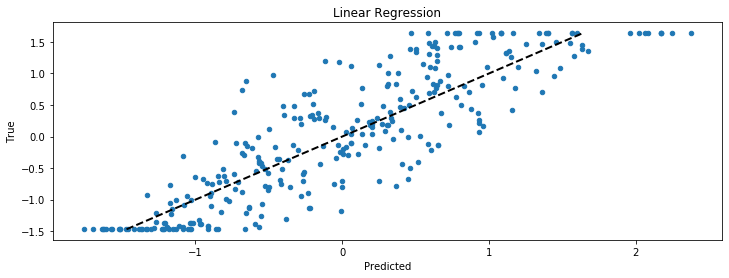

In [504]:
fig, ax1 = plt.subplots(1,1, figsize=(12,4)) 
ax1.scatter(ypoly_pred, y_test_poly, s=20) 
ax1.plot([y_test_poly.min(), y_test_poly.max()], [y_test_poly.min(), y_test_poly.max()], 'k--', lw=2) 
ax1.set_ylabel("True") 
ax1.set_xlabel("Predicted") 
ax1.set_title("Linear Regression") 

In [505]:
mse = np.mean((ypoly_pred-y_test)**2)
math.sqrt(mse)

1.3357371774367621

### As it is evident from the above results that using polynomial features the results are not improved. Therefore it is decided to not to use polynomial features. So, simple linear model would suffice, also costs less resources for deployment

# Model Tuning

## 1. Cross Validation
### The following algorithms are chosen for model tuning
* Linear Regression
* Decission Trees Regressor
* Random Forests Regressor
* Bagging Regressor
* Boosting Regressor

In [506]:
# Test and train data split
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X_orig, y_orig, train_size=0.7, test_size=0.3, random_state=100)

## Linear Regression

Since scaling has to be done inside the K Fold cross validation step to avoid the data leakage, a pipeline is constructed and passed to K Fold corssvalidation as a parameter

In [507]:
num_folds = 5
seed = 2

In [508]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
clf = LinearRegression()
class Scaler(StandardScaler):
    def transformation(self, X_poly, y = None):
        output = super.fit(X_poly,y)
        output = super().transform(X_poly)
        return output

In [509]:
pipeline = Pipeline([('sc', Scaler()), ('estimator', clf)])
lin_cv = KFold(n_splits=num_folds, shuffle = True,  random_state=seed)
result = cross_val_score(pipeline, X_train, y_train, scoring = 'r2', cv = lin_cv)
result

array([0.72060996, 0.77305284, 0.75337824, 0.72107187, 0.7218405 ])

In [510]:
print("Accuracy: %.3f%% (%.3f%%)" % (result.mean()*100.0, result.std()*100))

Accuracy: 73.799% (2.152%)


In [511]:
resultsDf = pd.DataFrame({'K-Fold CV':['LinearRegression'], 'accuracy': [result.mean()*100.0], 'deviation(%)': [result.std()*100]}, index=[1])
resultsDf = resultsDf[['K-Fold CV', 'accuracy', 'deviation(%)']]
resultsDf

,K-Fold CV,accuracy,deviation(%)
1,LinearRegression,73.799068,2.151881


## Decision Tree

In [512]:
from sklearn.tree import DecisionTreeRegressor
dcc = DecisionTreeRegressor() 
pipeline = Pipeline([('sc', Scaler()), ('estimator', dcc)])
dt_cv = KFold(n_splits=num_folds, shuffle = True,  random_state=seed)
dcc_result = cross_val_score(pipeline, X_train, y_train, cv = dt_cv)
dcc_result

array([0.8332856 , 0.84023699, 0.77015965, 0.78982653, 0.78918936])

In [513]:
print("Accuracy: %.3f%% (%.3f%%)" % (dcc_result.mean()*100.0, dcc_result.std()*100))

Accuracy: 80.454% (2.733%)


In [514]:
tempResultsDf = pd.DataFrame({'K-Fold CV':['DecissionTrees'], 'accuracy': [dcc_result.mean()*100.0], 'deviation(%)': [dcc_result.std()*100]}, index=[2])
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['K-Fold CV', 'accuracy', 'deviation(%)']]
resultsDf

,K-Fold CV,accuracy,deviation(%)
1,LinearRegression,73.799068,2.151881
2,DecissionTrees,80.453963,2.733029


## Random Forests

In [515]:
from sklearn.ensemble import RandomForestRegressor 
rfc = RandomForestRegressor(n_estimators=100)  
pipeline = Pipeline([('sc', Scaler()), ('estimator', rfc)])
rf_cv = KFold(n_splits=num_folds, shuffle = True,  random_state=seed)
rfc_result = cross_val_score(pipeline, X_train, y_train, cv = rf_cv)
rfc_result

array([0.91106719, 0.90095023, 0.87682925, 0.87118743, 0.87182377])

In [516]:
print("Accuracy: %.3f%% (%.3f%%)" % (rfc_result.mean()*100.0, rfc_result.std()*100))

Accuracy: 88.637% (1.647%)


In [517]:
tempResultsDf = pd.DataFrame({'K-Fold CV':['RandomForests'], 'accuracy': [rfc_result.mean()*100.0], 'deviation(%)': [rfc_result.std()*100]}, index=[3])
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['K-Fold CV', 'accuracy', 'deviation(%)']]
resultsDf

,K-Fold CV,accuracy,deviation(%)
1,LinearRegression,73.799068,2.151881
2,DecissionTrees,80.453963,2.733029
3,RandomForests,88.637158,1.646611


## Bagging

In [518]:
from sklearn.ensemble import BaggingRegressor
bgr = BaggingRegressor(n_estimators=100) 
pipeline = Pipeline([('sc', Scaler()), ('estimator', bgr)])
br_cv = KFold(n_splits=num_folds, shuffle = True,  random_state=seed)
bgr_result = cross_val_score(pipeline, X_orig, y_orig, cv = br_cv)
bgr_result

array([0.92932991, 0.89452434, 0.86815536, 0.9027466 , 0.91673692])

In [519]:
print("Accuracy: %.3f%% (%.3f%%)" % (bgr_result.mean()*100.0, bgr_result.std()*100))

Accuracy: 90.230% (2.081%)


In [520]:
tempResultsDf = pd.DataFrame({'K-Fold CV':['Bagging'], 'accuracy': [bgr_result.mean()*100.0], 'deviation(%)': [bgr_result.std()*100]}, index=[4])
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['K-Fold CV', 'accuracy', 'deviation(%)']]
resultsDf

,K-Fold CV,accuracy,deviation(%)
1,LinearRegression,73.799068,2.151881
2,DecissionTrees,80.453963,2.733029
3,RandomForests,88.637158,1.646611
4,Bagging,90.229862,2.081133


## Boosting

In [521]:
from sklearn.ensemble import GradientBoostingRegressor
abr = GradientBoostingRegressor(n_estimators=100) 
pipeline = Pipeline([('sc', Scaler()), ('estimator', abr)])
bor_cv = KFold(n_splits=num_folds, shuffle = True,  random_state=seed)
gbr_result = cross_val_score(pipeline, X_orig, y_orig, cv = bor_cv)
gbr_result

array([0.90778454, 0.88201672, 0.85810901, 0.88261492, 0.91538092])

In [522]:
print("Accuracy: %.3f%% (%.3f%%)" % (gbr_result.mean()*100.0, gbr_result.std()*100))

Accuracy: 88.918% (2.046%)


In [523]:
tempResultsDf = pd.DataFrame({'K-Fold CV':['Boosting'], 'accuracy': [gbr_result.mean()*100.0], 'deviation(%)': [gbr_result.std()*100]}, index=[5])
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['K-Fold CV', 'accuracy', 'deviation(%)']]
resultsDf

,K-Fold CV,accuracy,deviation(%)
1,LinearRegression,73.799068,2.151881
2,DecissionTrees,80.453963,2.733029
3,RandomForests,88.637158,1.646611
4,Bagging,90.229862,2.081133
5,Boosting,88.918122,2.045696


## 2. Model Tuning

## GridSearch CV for Randomforests

In [524]:
from sklearn.feature_selection import RFE
from sklearn.model_selection import GridSearchCV
lin_gc = KFold(n_splits=num_folds, shuffle = True,  random_state=seed)
hyper_params = [{'n_features_to_select': list(range(1, 9))}]
lm = LinearRegression()
lm.fit(X_train_poly, y_train_poly)
rfe = RFE(lm)   
model_cv = GridSearchCV(estimator = rfe, 
                        param_grid = hyper_params, 
                        scoring= 'r2', 
                        cv = lin_gc, 
                        verbose = 1,
                        return_train_score=True)   
model_cv.fit(X_train_poly, y_train_poly) 

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:    0.6s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=2, shuffle=True),
             error_score=nan,
             estimator=RFE(estimator=LinearRegression(copy_X=True,
                                                      fit_intercept=True,
                                                      n_jobs=None,
                                                      normalize=False),
                           n_features_to_select=None, step=1, verbose=0),
             iid='deprecated', n_jobs=None,
             param_grid=[{'n_features_to_select': [1, 2, 3, 4, 5, 6, 7, 8]}],
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='r2', verbose=1)

In [525]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.019348,0.003816,0.001396,4.889867e-04,1,{'n_features_to_select': 1},0.206817,0.183859,0.246583,0.241747,...,0.230492,0.031516,8,0.274301,0.262014,0.272890,0.269886,0.265156,0.268849,0.004636
1,0.017354,0.001620,0.000997,4.523674e-07,2,{'n_features_to_select': 2},0.447174,0.480432,0.516398,0.512115,...,0.480708,0.029976,7,0.495677,0.491987,0.481349,0.483540,0.500490,0.490609,0.007224
2,0.016755,0.003116,0.001197,3.978989e-04,3,{'n_features_to_select': 3},0.561942,0.598442,0.575666,0.648722,...,0.596384,0.029528,6,0.608637,0.650454,0.608898,0.590997,0.602096,0.612217,0.020192
3,0.017354,0.001017,0.000999,1.465062e-06,4,{'n_features_to_select': 4},0.716136,0.665481,0.717521,0.695625,...,0.696809,0.019194,5,0.702078,0.730815,0.702880,0.708088,0.710313,0.710835,0.010460
4,0.016755,0.001716,0.001197,3.982790e-04,5,{'n_features_to_select': 5},0.752232,0.676455,0.757199,0.735992,...,0.729840,0.028789,4,0.739504,0.751383,0.739258,0.744569,0.747517,0.744446,0.004667
5,0.013962,0.001093,0.000997,2.861023e-07,6,{'n_features_to_select': 6},0.750817,0.695376,0.758551,0.748824,...,0.735891,0.023000,3,0.747812,0.765216,0.748395,0.749535,0.756900,0.753572,0.006677
6,0.010775,0.001160,0.000798,3.988506e-04,7,{'n_features_to_select': 7},0.767113,0.706548,0.769115,0.747305,...,0.745924,0.022715,2,0.754520,0.769643,0.754865,0.759133,0.762606,0.760153,0.005600
7,0.011171,0.001165,0.000797,3.984015e-04,8,{'n_features_to_select': 8},0.769295,0.710641,0.774461,0.762152,...,0.752676,0.022985,1,0.758525,0.773215,0.758072,0.763842,0.768200,0.764371,0.005779


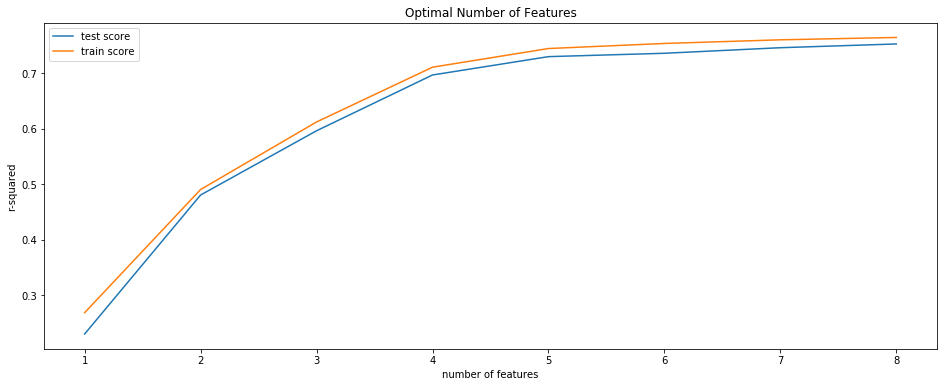

In [526]:
# plotting cv results
plt.figure(figsize=(16,6))

plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_test_score"])
plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')

In [527]:

# final model
n_features_optimal = 10

lm = LinearRegression()
lm.fit(X_train_poly, y_train_poly)

rfe = RFE(lm, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_train_poly, y_train_poly)

y_pred = lm.predict(X_test_poly)
r2 = r2_score(y_test_poly, y_pred)
print("The best R2 score from GridSeach is: ",r2)

The best R2 score from GridSeach is:  0.7579270030747157


In [528]:
hyperDf = pd.DataFrame({'HyperParameterTuning':['LinearRegression'],'Method':['GridSearchCV'], 'Accuracy(%)': [r2*100]}, index=[1])
hyperDf = hyperDf[['HyperParameterTuning', 'Method', 'Accuracy(%)']]
hyperDf

,HyperParameterTuning,Method,Accuracy(%)
1,LinearRegression,GridSearchCV,75.7927


### As it can be seen from above graph feature extraction has no significance in this model. Features above 5 are have slight effect on r2 score, which can also be seen from p-values evaluation in the section above. The above results seems to be slight overfilt as the training results are little higher than testing results. In this case lasso/ridge optimization methods can be used with a grid search cv of alpha parameter.

## RandomSearch CV for Randomforests

In [529]:
X_train, X_test, y_train, y_test = train_test_split(X_orig, y_orig, train_size=0.7, test_size=0.3, random_state=100)

In [530]:
from sklearn.model_selection import GridSearchCV
from scipy.stats import randint as sp_randint
from sklearn.metrics import mean_squared_error
rf = RandomForestRegressor(n_estimators= 100)
# Number of trees in random forest
#n_estimators = ['n_estimators': range(100, 1500, 400)]
# Number of features to consider at every split
#max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
#max_depth = ['max_depth': range(2, 20, 5)]
# Minimum number of samples required to split a node
#min_samples_split = [2, 5, 10, 15, 100]
# Minimum number of samples required at each leaf node
#min_samples_leaf = [1, 2, 5, 10]
# Method of selecting samples for training each tree
# bootstrap = [True, False]

# Create the random grid
random_grid = {'max_features': [1, 4, 7, 9, 12, 16, 22]}

In [531]:
rf_results = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1, return_train_score = True)

In [532]:
fitted_model = rf_results.fit(X_train, y_train)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  35 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    0.4s finished


In [533]:
print(rf_results.best_params_)

{'max_features': 4}


In [534]:
rfc1 = RandomForestRegressor(max_features= 4) 
rfc1.fit(X_train, y_train)
y_pred_rfr = rfc1.predict(X_test) 
test_acc = rfc1.score(X_test, y_test)
print(f"Random forest Random search acccuracy score: {test_acc}")

Random forest Random search acccuracy score: 0.8967011872414827


In [535]:
random_grid = {'n_estimators': range(100, 1500, 400)}
rf_results = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1, return_train_score = True)
fitted_model = rf_results.fit(X_train, y_train)
print(rf_results.best_params_)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   8 out of  20 | elapsed:    1.6s remaining:    2.4s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:    4.7s finished
{'n_estimators': 100}


In [536]:
rfc1 = RandomForestRegressor(n_estimators= 100, max_features= 4) 
rfc1.fit(X_train, y_train)
y_pred_rfr = rfc1.predict(X_test) 
test_acc = rfc1.score(X_test, y_test)
print(f"Random forest Random search acccuracy score: {test_acc}")

Random forest Random search acccuracy score: 0.8965970927607056


In [537]:
random_grid = {'min_samples_leaf': range(1, 10, 1)}
rf_results = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1, return_train_score = True)
fitted_model = rf_results.fit(X_train, y_train)
print(rf_results.best_params_)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:    1.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:    1.1s finished
{'min_samples_leaf': 1}


In [538]:
rfc1 = RandomForestRegressor(n_estimators= 100, max_features= 4, min_samples_leaf= 1) 
rfc1.fit(X_train, y_train)
y_pred_rfr = rfc1.predict(X_test) 
test_acc = rfc1.score(X_test, y_test)
print(f"Random forest Random search acccuracy score: {test_acc}")

Random forest Random search acccuracy score: 0.8988351358205766


In [539]:
random_grid = {'min_samples_split': range(1, 10, 1)}
rf_results = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1, return_train_score = True)
fitted_model = rf_results.fit(X_train, y_train)
print(rf_results.best_params_)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:    1.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:    1.1s finished
{'min_samples_split': 3}


In [540]:
rfc1 = RandomForestRegressor(n_estimators= 100, max_features= 4, min_samples_leaf= 1, min_samples_split= 2) 
rfc1.fit(X_train, y_train)
y_pred_rfr = rfc1.predict(X_test) 
test_acc = rfc1.score(X_test, y_test)
print(f"Random forest Random search acccuracy score: {test_acc}")

Random forest Random search acccuracy score: 0.8979610902912075


In [541]:
random_grid = {'max_depth': [4,8,10,15]}
rf_results = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1, return_train_score = True)
fitted_model = rf_results.fit(X_train, y_train)
print(rf_results.best_params_)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   8 out of  20 | elapsed:    0.2s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:    0.5s finished
{'max_depth': 15}


In [542]:
rfc1 = RandomForestRegressor(n_estimators= 100, max_features= 4, min_samples_leaf= 1, min_samples_split= 2, max_depth= 15) 
rfc1.fit(X_train, y_train)
y_pred_rfr = rfc1.predict(X_test) 
test_acc = rfc1.score(X_test, y_test)
print(f"Random forest Random search acccuracy score: {test_acc}")

Random forest Random search acccuracy score: 0.8913563879781448


In [543]:
tempResultsDf = pd.DataFrame({'HyperParameterTuning':['RandomForests'],'Method':['GridSearchCV'], 'Accuracy(%)': [test_acc*100]}, index=[2])
hyperDf = pd.concat([hyperDf, tempResultsDf])
hyperDf = hyperDf[['HyperParameterTuning', 'Method', 'Accuracy(%)']]
hyperDf

,HyperParameterTuning,Method,Accuracy(%)
1,LinearRegression,GridSearchCV,75.792700
2,RandomForests,GridSearchCV,89.135639


## Conclusion
### The predicted concrete strength using data avilable by applying feature engineering and model tuning is achieved with an R2 score within 80% to 95% as asked in the project statement.
